## Project 2 Plotting
Jacob Minkin
This file will plot some of the data that I have

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from sklearn.impute import KNNImputer
sns.set_style('darkgrid')

#Import Data
df = pd.read_csv('../data/Inspection.csv')
df['date'] = pd.to_datetime(df['INSPECTION DATE'])

## Find most recent score for every restaurant

<AxesSubplot:>

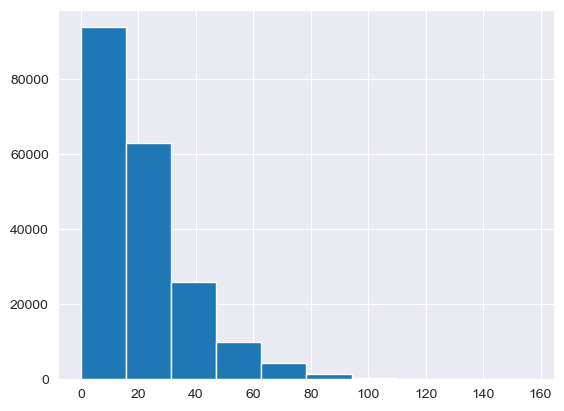

In [21]:
df.SCORE.hist()

In [5]:
df.sort_values(['date'], ascending=False, inplace= True)
df_recent = df.groupby(['CAMIS'], sort=False).first()

,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE,INSPECTION DATE,ACTION,CODE,...,BIN,BBL,NTA,Location Point,Zip Codes,Community Districts,Borough Boundaries,City Council Districts,Police Precincts,date
CAMIS,,,,,,,,,,,,,,,,,,,,,
40535738,NEIL SIMON THEATRE,Manhattan,250,WEST 52 STREET,10019.0,2123544624,American,2/8/2023,No violations were recorded at the time of thi...,None,...,1024820.0,1.010230e+09,MN17,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-08
50130587,ST. FRANCIS COLLEGE,Brooklyn,179,LIVINGSTON ST,11201.0,7184092070,American,2/6/2023,No violations were recorded at the time of thi...,None,...,NaN,3.000000e+00,BK38,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-06
50019120,NEW TOPAZ,Manhattan,127,WEST 56 STREET,10019.0,2129578020,Thai,2/3/2023,Violations were cited in the following area(s).,20-06,...,1023453.0,1.010090e+09,MN17,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-03
50084290,ARIA WEST VILLAGE,Manhattan,14-16,BEDFORD STREET,10014.0,2122424233,Italian,2/2/2023,Establishment re-opened by DOHMH.,08A,...,1008347.0,1.005270e+09,MN23,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-02
41531136,AUGUST WILSON THEATRE,Manhattan,245,WEST 52 STREET,10019.0,2125825472,American,2/1/2023,No violations were recorded at the time of thi...,None,...,1024826.0,1.010240e+09,MN17,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50044778,"CHICKEN, FRIES CONCESSION",Manhattan,4,PENN PLZ,10121.0,2124656273,Chicken,5/30/2019,No violations were recorded at the time of thi...,10F,...,1082908.0,1.007810e+09,MN17,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-30
50074493,PINKY'S SPACE,Manhattan,70,EAST 1 STREET,10003.0,5127896128,Other,5/18/2019,No violations were recorded at the time of thi...,10F,...,1006099.0,1.004430e+09,MN22,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-18
50002422,TAGLIERE,Queens,None,JFK INTERNATIONAL AIRPORT,11430.0,6464835087,Pizza,5/16/2019,No violations were recorded at the time of thi...,10F,...,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-16


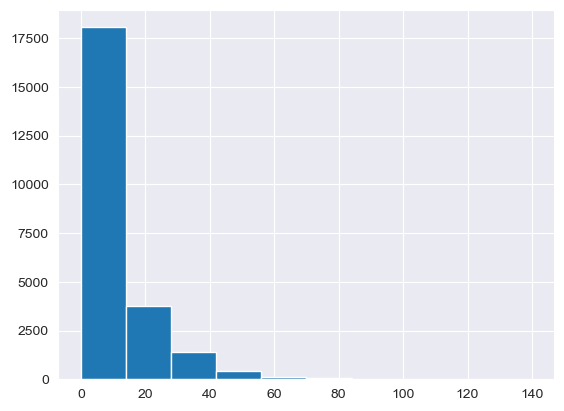

In [6]:
df_recent.SCORE.hist()
(df_recent[df_recent.SCORE == 0])

In [45]:
df_recent[df_recent.ACTION == 'No violations were recorded at the time of this inspection.']

,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE,INSPECTION DATE,ACTION,VIOLATION CODE,...,BIN,BBL,NTA,Location Point,Zip Codes,Community Districts,Borough Boundaries,City Council Districts,Police Precincts,date
CAMIS,,,,,,,,,,,,,,,,,,,,,
41267566,SMITH & MILLS,Manhattan,71,NORTH MOORE STREET,10013.0,2122262515,American,2/9/2023,No violations were recorded at the time of thi...,None,...,1002123.0,1.001880e+09,MN24,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-09
50111280,PLANTSHED COFFEE BAR,Manhattan,723,AMSTERDAM AVENUE,10025.0,2126624400,Coffee/Tea,2/9/2023,No violations were recorded at the time of thi...,06C,...,1032587.0,1.012268e+09,MN12,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-09
50080435,FULKOLE RESTAURANT,Brooklyn,1211,LIBERTY AVENUE,11208.0,9173536405,Bangladeshi,2/9/2023,No violations were recorded at the time of thi...,02H,...,3094137.0,3.041840e+09,BK83,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-09
40535738,NEIL SIMON THEATRE,Manhattan,250,WEST 52 STREET,10019.0,2123544624,American,2/8/2023,No violations were recorded at the time of thi...,None,...,1024820.0,1.010230e+09,MN17,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-08
50130587,ST. FRANCIS COLLEGE,Brooklyn,179,LIVINGSTON ST,11201.0,7184092070,American,2/6/2023,No violations were recorded at the time of thi...,None,...,NaN,3.000000e+00,BK38,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50002422,TAGLIERE,Queens,None,JFK INTERNATIONAL AIRPORT,11430.0,6464835087,Pizza,5/16/2019,No violations were recorded at the time of thi...,10F,...,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-16
41534086,LA PIZZA & CONVENIENCE,Brooklyn,887,MANHATTAN AVENUE,11222.0,7183830666,Pizza,5/1/2019,No violations were recorded at the time of thi...,22C,...,3064834.0,3.025630e+09,BK76,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-01
40483596,GERSHWIN THEATRE,Manhattan,222,WEST 51 STREET,10019.0,2123544624,Other,10/23/2018,No violations were recorded at the time of thi...,20D,...,1024812.0,1.010220e+09,MN17,NaN,NaN,NaN,NaN,NaN,NaN,2018-10-23


In [58]:
df[['CAMIS','GRADE','SCORE', 'date']].loc[df.DBA == 'LA PIZZA & CONVENIENCE']

,CAMIS,GRADE,SCORE,date
142464,41534086,NaN,NaN,2019-05-01
24100,41534086,A,11.0,2019-05-01
201875,41534086,A,11.0,2019-05-01
3170,41534086,A,11.0,2019-05-01
77494,41534086,A,13.0,2018-12-18
11567,41534086,A,13.0,2018-12-18
99483,41534086,A,13.0,2018-12-18
111741,41534086,NaN,30.0,2018-11-28
34686,41534086,NaN,30.0,2018-11-28
115965,41534086,NaN,30.0,2018-11-28


In [60]:
df_recent[['GRADE','SCORE', 'date']].loc[df_recent.DBA == 'LA PIZZA & CONVENIENCE']

,GRADE,SCORE,date
CAMIS,,,
41534086,A,11.0,2019-05-01


In [63]:
df_recent.DBA[df_recent.GRADE.isna()]

CAMIS
50094469                   REVOLVER
50131837              SQUARE COFFEE
50107767                       None
50109856        THE LATE NIGHT CAFE
50131536    MARRON PASTRY MANHATTAN
                     ...           
50119778                       None
50131312             167 PIZZA CAFE
50131515                       None
50123260        LITTLE NECK KITCHEN
50107551                     Zazzys
Name: DBA, Length: 4358, dtype: object

In [70]:
df_unranked = df[df['INSPECTION DATE'] == '1/1/1900']

In [74]:
df_recent = df_recent[df_recent['INSPECTION DATE'] != '1/1/1900']

<AxesSubplot:>

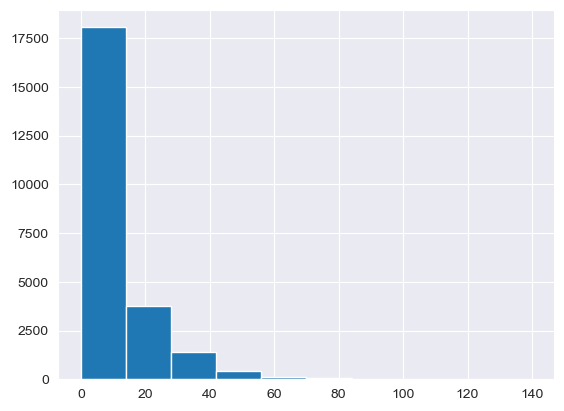

In [78]:
df_recent.SCORE.hist()

In [2]:
fp = "../data/base_map/geo_export_68048701-5e7b-45e0-ac1c-85b45c057d6d.shp"
map_data = gpd.read_file(fp)


In [7]:
no_NA = df_recent.loc[(df_recent.Longitude != 0) & (df_recent.Latitude != 0)]
df_recent.rename(columns = {'VIOLATION CODE':'CODE'}, inplace = True)
gdf = gpd.GeoDataFrame(
    no_NA, geometry=gpd.points_from_xy(no_NA.Longitude, no_NA.Latitude))  

Text(0.5, 1.0, 'New York City Resteraunts')

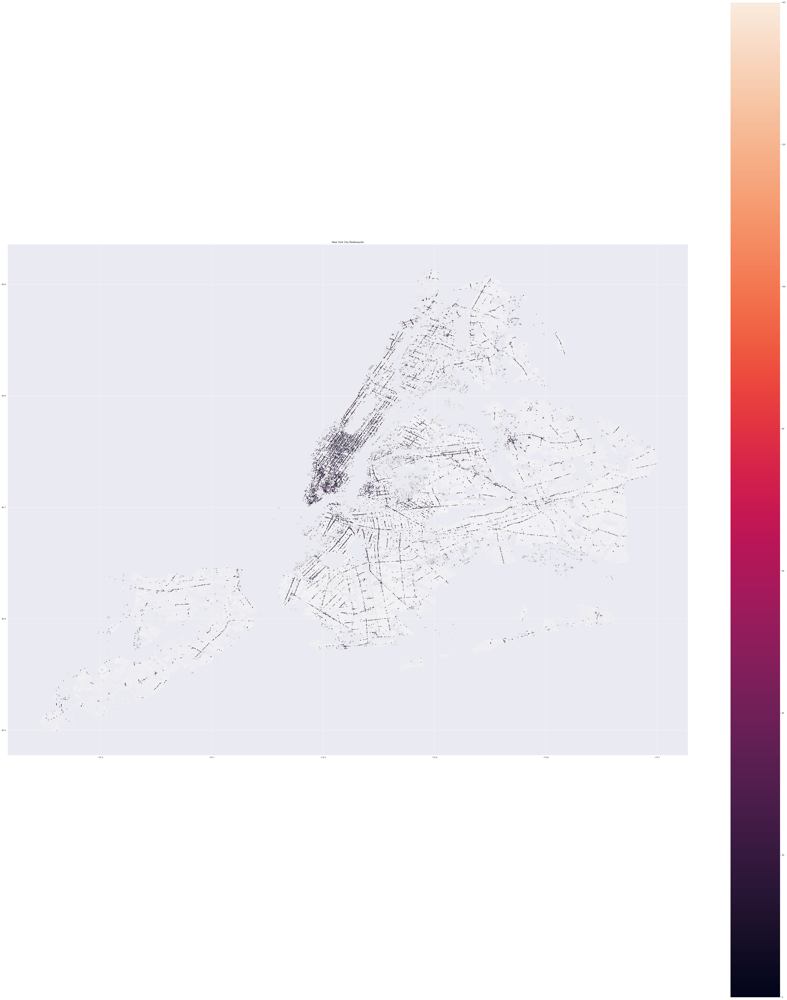

In [8]:
fig, ax = plt.subplots(figsize=(68, 80))
map_data.plot(ax=ax, color="grey", alpha=0.4)
""" gdf[gdf.CUISINE == "Chinese"].plot(ax=ax, markersize=2, color="red", marker="o")
gdf[gdf.CUISINE == "American"].plot(ax=ax, markersize=2, color="blue", marker="o")
gdf[gdf.CUISINE == "Pizza"].plot(ax=ax, markersize=2, color="green", marker="o")
gdf[gdf.CUISINE == "Coffee/Tea"].plot(ax=ax, markersize=2, color="purple", marker="o") """

gdf.plot('SCORE', ax=ax, markersize=2, marker="o", legend= True)

plt.title("New York City Resteraunts")




<AxesSubplot:>

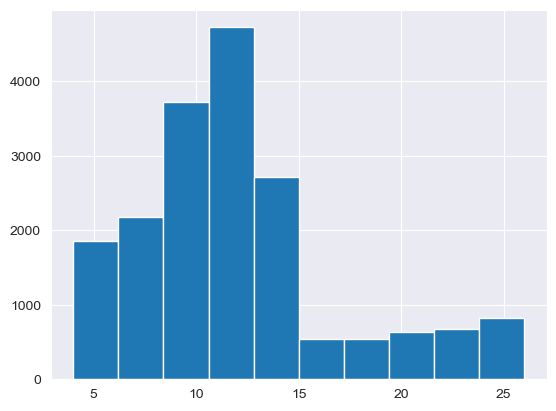

In [15]:
q_low = gdf["SCORE"].quantile(0.10)
q_hi  = gdf["SCORE"].quantile(0.90)

gdf_filtered = gdf[(gdf["SCORE"] < q_hi) & (gdf["SCORE"] > q_low)]
gdf_filtered.SCORE.hist()

Text(0.5, 1.0, 'New York City Resteraunts')

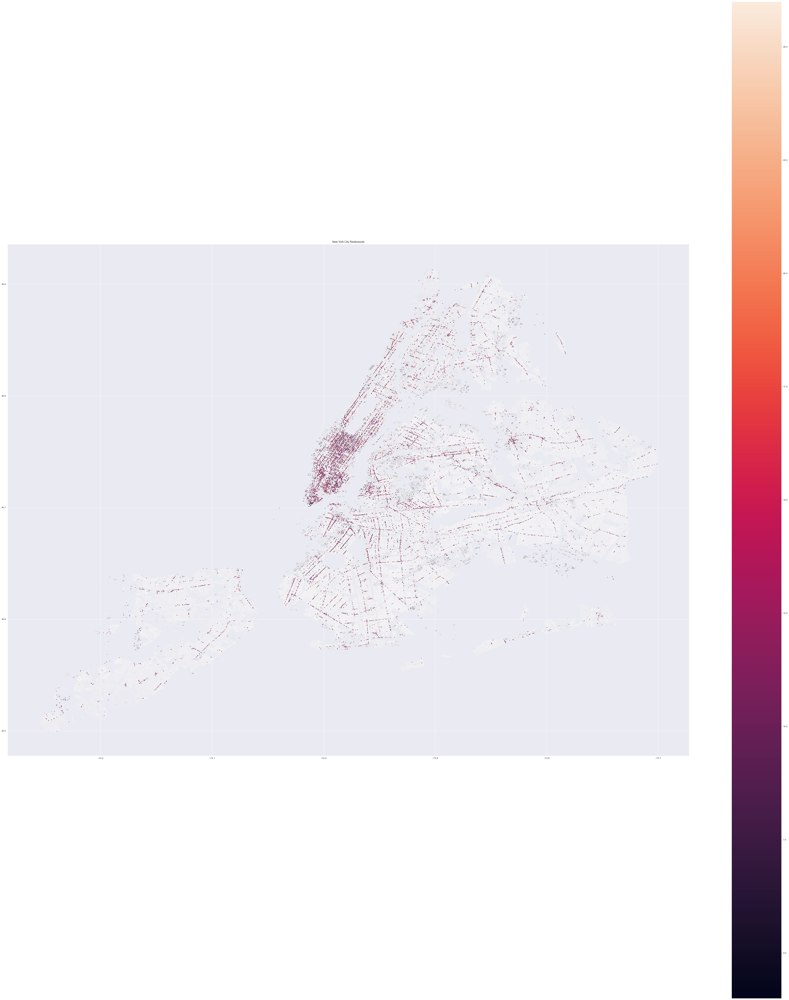

In [14]:
fig, ax = plt.subplots(figsize=(68, 80))
map_data.plot(ax=ax, color="grey", alpha=0.4)
""" gdf[gdf.CUISINE == "Chinese"].plot(ax=ax, markersize=2, color="red", marker="o")
gdf[gdf.CUISINE == "American"].plot(ax=ax, markersize=2, color="blue", marker="o")
gdf[gdf.CUISINE == "Pizza"].plot(ax=ax, markersize=2, color="green", marker="o")
gdf[gdf.CUISINE == "Coffee/Tea"].plot(ax=ax, markersize=2, color="purple", marker="o") """

gdf_filtered.plot('SCORE', ax=ax, markersize=2, marker="o", legend= True)

plt.title("New York City Resteraunts")


